# IMDB Midterm Project

<b> Derek Cox, "On my honor, as a student, I have neither given nor received unauthorized aid on this academic work."</b>

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

In [2]:
df = pd.read_csv('data/movie_metadata.csv')
df.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


## Basic Statistics and information

In [3]:
df.describe()

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
count,4993.000000,5028.000000,4939.000000,5020.000000,5036.000000,4.159000e+03,5.043000e+03,5043.000000,5030.000000,5022.000000,4.551000e+03,4935.000000,5030.000000,5043.000000,4714.000000,5043.000000
mean,140.194272,107.201074,686.509212,645.009761,6560.047061,4.846841e+07,8.366816e+04,9699.063851,1.371173,272.770808,3.975262e+07,2002.470517,1651.754473,6.442138,2.220403,7525.964505
std,121.601675,25.197441,2813.328607,1665.041728,15020.759120,6.845299e+07,1.384853e+05,18163.799124,2.013576,377.982886,2.061149e+08,12.474599,4042.438863,1.125116,1.385113,19320.445110
min,1.000000,7.000000,0.000000,0.000000,0.000000,1.620000e+02,5.000000e+00,0.000000,0.000000,1.000000,2.180000e+02,1916.000000,0.000000,1.600000,1.180000,0.000000
25%,50.000000,93.000000,7.000000,133.000000,614.000000,5.340988e+06,8.593500e+03,1411.000000,0.000000,65.000000,6.000000e+06,1999.000000,281.000000,5.800000,1.850000,0.000000
50%,110.000000,103.000000,49.000000,371.500000,988.000000,2.551750e+07,3.435900e+04,3090.000000,1.000000,156.000000,2.000000e+07,2005.000000,595.000000,6.600000,2.350000,166.000000
75%,195.000000,118.000000,194.500000,636.000000,11000.000000,6.230944e+07,9.630900e+04,13756.500000,2.000000,326.000000,4.500000e+07,2011.000000,918.000000,7.200000,2.350000,3000.000000
max,813.000000,511.000000,23000.000000,23000.000000,640000.000000,7.605058e+08,1.689764e+06,656730.000000,43.000000,5060.000000,1.221550e+10,2016.000000,137000.000000,9.500000,16.000000,349000.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
color                        5024 non-null object
director_name                4939 non-null object
num_critic_for_reviews       4993 non-null float64
duration                     5028 non-null float64
director_facebook_likes      4939 non-null float64
actor_3_facebook_likes       5020 non-null float64
actor_2_name                 5030 non-null object
actor_1_facebook_likes       5036 non-null float64
gross                        4159 non-null float64
genres                       5043 non-null object
actor_1_name                 5036 non-null object
movie_title                  5043 non-null object
num_voted_users              5043 non-null int64
cast_total_facebook_likes    5043 non-null int64
actor_3_name                 5020 non-null object
facenumber_in_poster         5030 non-null float64
plot_keywords                4890 non-null object
movie_imdb_link              5043 non-

## Determining data quality issues and resolving them

### Determine number of null values and fill them

In [5]:
df.isnull().sum()

color                         19
director_name                104
num_critic_for_reviews        50
duration                      15
director_facebook_likes      104
actor_3_facebook_likes        23
actor_2_name                  13
actor_1_facebook_likes         7
gross                        884
genres                         0
actor_1_name                   7
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  23
facenumber_in_poster          13
plot_keywords                153
movie_imdb_link                0
num_user_for_reviews          21
language                      12
country                        5
content_rating               303
budget                       492
title_year                   108
actor_2_facebook_likes        13
imdb_score                     0
aspect_ratio                 329
movie_facebook_likes           0
dtype: int64

In [6]:
# dropping redudant/irrelevant columns
df = df.drop([
    'actor_2_name', 'actor_3_name', 'actor_2_facebook_likes',
    'actor_3_facebook_likes', 'movie_imdb_link'
],
             axis=1)
df.isnull().sum()

color                         19
director_name                104
num_critic_for_reviews        50
duration                      15
director_facebook_likes      104
actor_1_facebook_likes         7
gross                        884
genres                         0
actor_1_name                   7
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
facenumber_in_poster          13
plot_keywords                153
num_user_for_reviews          21
language                      12
country                        5
content_rating               303
budget                       492
title_year                   108
imdb_score                     0
aspect_ratio                 329
movie_facebook_likes           0
dtype: int64

In [7]:
# dropping columns with major data integrity issues
df = df.dropna(subset=['gross'])
df = df.dropna(subset=['budget'])

### Clean up country data and narrow the data set.

In [8]:
df.groupby('country').size().sort_values(ascending=False).head(10)

country
USA          3074
UK            325
France        106
Germany        82
Canada         64
Australia      41
Spain          22
Japan          17
China          15
India          14
dtype: int64

In [9]:
# function to alter country names
def f(x):
    if x == 'USA':
        return 'USA'
    elif x == 'UK':
        return 'UK'
    elif x == 'France':
        return 'France'
    elif x == 'Canada':
        return 'Canada'
    elif x == 'Germany':
        return 'Germany'
    elif x == 'Canada':
        return 'Canada'
    elif x == 'Australia':
        return 'Australia'
    else:
        return 'others'


# apply the function
df['country'] = df['country'].apply(f)

In [10]:
# filling na values for country
df = df.fillna({'country': 'others'})
country = df.groupby('country').size().sort_values()

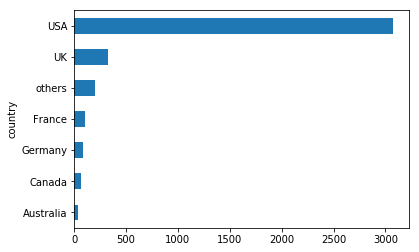

In [11]:
country.plot(kind='barh')

In [12]:
df.isnull().sum()

color                         2
director_name                 0
num_critic_for_reviews        1
duration                      1
director_facebook_likes       0
actor_1_facebook_likes        3
gross                         0
genres                        0
actor_1_name                  3
movie_title                   0
num_voted_users               0
cast_total_facebook_likes     0
facenumber_in_poster          6
plot_keywords                31
num_user_for_reviews          0
language                      3
country                       0
content_rating               51
budget                        0
title_year                    0
imdb_score                    0
aspect_ratio                 75
movie_facebook_likes          0
dtype: int64

In [13]:
# determining most popular aspect ratio to fill null values
df.groupby('aspect_ratio').size().sort_values(ascending=False).head()

aspect_ratio
2.35    2014
1.85    1613
1.37      50
1.78      41
1.66      40
dtype: int64

In [14]:
ar = df['aspect_ratio'].median()
ar

2.35

In [15]:
# filling na values for aspect_ratio
df = df.fillna({'aspect_ratio': ar})

In [16]:
df.isnull().sum()

color                         2
director_name                 0
num_critic_for_reviews        1
duration                      1
director_facebook_likes       0
actor_1_facebook_likes        3
gross                         0
genres                        0
actor_1_name                  3
movie_title                   0
num_voted_users               0
cast_total_facebook_likes     0
facenumber_in_poster          6
plot_keywords                31
num_user_for_reviews          0
language                      3
country                       0
content_rating               51
budget                        0
title_year                    0
imdb_score                    0
aspect_ratio                  0
movie_facebook_likes          0
dtype: int64

### 2b. Examining and cleaning up content_rating

In [17]:
# determining number of rating values
df.groupby('content_rating').size().sort_values(ascending=False)

content_rating
R            1737
PG-13        1331
PG            576
G              91
Not Rated      42
Unrated        24
Approved       17
X              10
NC-17           6
Passed          3
M               2
GP              1
dtype: int64

In [18]:
# cleaning up content rating data to reduce fragmentation

# removing not rated films or unscaled ratings
df = df.replace(['Not Rated', 'Unrated', 'Approved', 'Passed'], np.nan)
# GP was replaced by PG in 1972
df = df.replace('GP', 'PG')
# after 1996 X was replaced by NC-17, M is similar in rating
df = df.replace(['X', 'M'], 'NC-17')
df.groupby('content_rating').size()

content_rating
G          91
NC-17      18
PG        577
PG-13    1331
R        1737
dtype: int64

In [19]:
df.isnull().sum()

color                          2
director_name                  0
num_critic_for_reviews         1
duration                       1
director_facebook_likes        0
actor_1_facebook_likes         3
gross                          0
genres                         0
actor_1_name                   3
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
facenumber_in_poster           6
plot_keywords                 31
num_user_for_reviews           0
language                       3
country                        0
content_rating               137
budget                         0
title_year                     0
imdb_score                     0
aspect_ratio                   0
movie_facebook_likes           0
dtype: int64

In [20]:
# drop remaining na values
df = df.dropna()
df.isnull().sum()

color                        0
director_name                0
num_critic_for_reviews       0
duration                     0
director_facebook_likes      0
actor_1_facebook_likes       0
gross                        0
genres                       0
actor_1_name                 0
movie_title                  0
num_voted_users              0
cast_total_facebook_likes    0
facenumber_in_poster         0
plot_keywords                0
num_user_for_reviews         0
language                     0
country                      0
content_rating               0
budget                       0
title_year                   0
imdb_score                   0
aspect_ratio                 0
movie_facebook_likes         0
dtype: int64

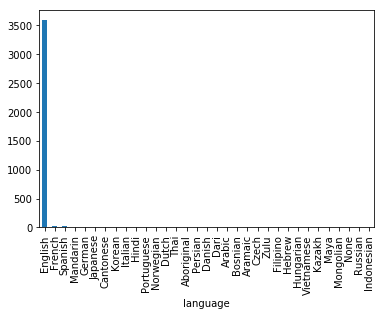

In [21]:
df.groupby('language').size().sort_values(ascending=False).plot(kind='bar')

* English is massive in the data, so it makes sense to combine other languages into a single category

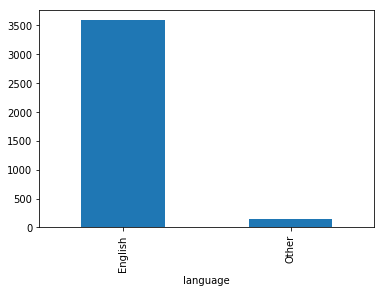

In [22]:
# assigning other values since English is so unproportionally dominant
def l(x):
    if x == 'English':
        return 'English'
    else:
        return 'Other'


df['language'] = df['language'].apply(l)
df.groupby('language').size().sort_values(ascending=False).plot(kind='bar')

* Data is obviously very skewed towards English, but this is better

## Analysis

### Preliminary correlation analysis

In [23]:
df.corr()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes
num_critic_for_reviews,1.000000,0.240520,0.175906,0.164181,0.467548,0.594588,0.235256,-0.035100,0.565677,0.105107,0.450125,0.355652,0.237539,0.704726
duration,0.240520,1.000000,0.185630,0.087183,0.254162,0.348770,0.124693,0.022484,0.360235,0.070360,-0.118916,0.368634,0.206662,0.221364
director_facebook_likes,0.175906,0.185630,1.000000,0.088365,0.138518,0.300571,0.117333,-0.048022,0.217619,0.017930,-0.060235,0.195921,0.047383,0.162017
actor_1_facebook_likes,0.164181,0.087183,0.088365,1.000000,0.140991,0.176741,0.944767,0.061938,0.119168,0.015225,0.091979,0.098826,0.072776,0.128573
gross,0.467548,0.254162,0.138518,0.140991,1.000000,0.626746,0.232632,-0.030634,0.545825,0.099041,0.048890,0.223239,0.080684,0.368467
num_voted_users,0.594588,0.348770,0.300571,0.176741,0.626746,1.000000,0.246749,-0.034678,0.779138,0.065932,0.019574,0.487322,0.110730,0.518212
cast_total_facebook_likes,0.235256,0.124693,0.117333,0.944767,0.232632,0.246749,1.000000,0.084629,0.176066,0.027381,0.123705,0.113378,0.087936,0.204058
facenumber_in_poster,-0.035100,0.022484,-0.048022,0.061938,-0.030634,-0.034678,0.084629,1.000000,-0.083153,-0.021816,0.092237,-0.065693,0.031471,0.016065
num_user_for_reviews,0.565677,0.360235,0.217619,0.119168,0.545825,0.779138,0.176066,-0.083153,1.000000,0.070300,0.011946,0.330690,0.128670,0.370609
budget,0.105107,0.070360,0.017930,0.015225,0.099041,0.065932,0.027381,-0.021816,0.070300,1.000000,0.045085,0.032055,0.031454,0.052302


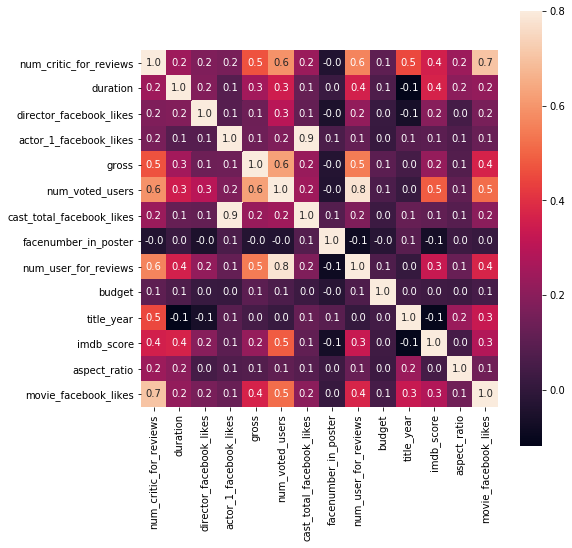

In [24]:
plt.figure(figsize=(8, 8))
sns.heatmap(df.corr(), vmax=.8, square=True, annot=True, fmt=".1f")

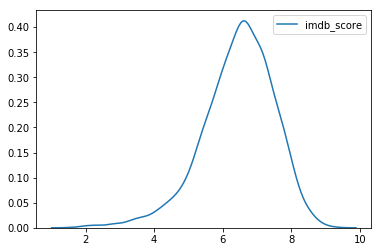

In [25]:
# check density of imdb_score
sns.kdeplot(df.imdb_score)

In [26]:
# for experiment
df1 = df
# setting my own values for bins
df1['imdbscores_bins'] = pd.cut(df1['imdb_score'],
                                bins=[0, 4, 6, 7, 8, 10],
                                labels=['1', '2', '3', '4', '5'])
# see the result
df1.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,num_user_for_reviews,language,country,content_rating,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,imdbscores_bins
0,Color,James Cameron,723.0,178.0,0.0,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,3054.0,English,USA,PG-13,237000000.0,2009.0,7.9,1.78,33000,4
1,Color,Gore Verbinski,302.0,169.0,563.0,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,1238.0,English,USA,PG-13,300000000.0,2007.0,7.1,2.35,0,4
2,Color,Sam Mendes,602.0,148.0,0.0,11000.0,200074175.0,Action|Adventure|Thriller,Christoph Waltz,Spectre,...,994.0,English,UK,PG-13,245000000.0,2015.0,6.8,2.35,85000,3
3,Color,Christopher Nolan,813.0,164.0,22000.0,27000.0,448130642.0,Action|Thriller,Tom Hardy,The Dark Knight Rises,...,2701.0,English,USA,PG-13,250000000.0,2012.0,8.5,2.35,164000,5
5,Color,Andrew Stanton,462.0,132.0,475.0,640.0,73058679.0,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,...,738.0,English,USA,PG-13,263700000.0,2012.0,6.6,2.35,24000,3


### Determining what factors cause a low IMDB score

In [27]:
year_rate_fig = px.violin(df1,
                          y='title_year',
                          x='imdbscores_bins',
                          points='all',
                          hover_name='movie_title')

year_rate_fig

* It appears that over time as more movies are been made the potential for a lower rating is more likely.

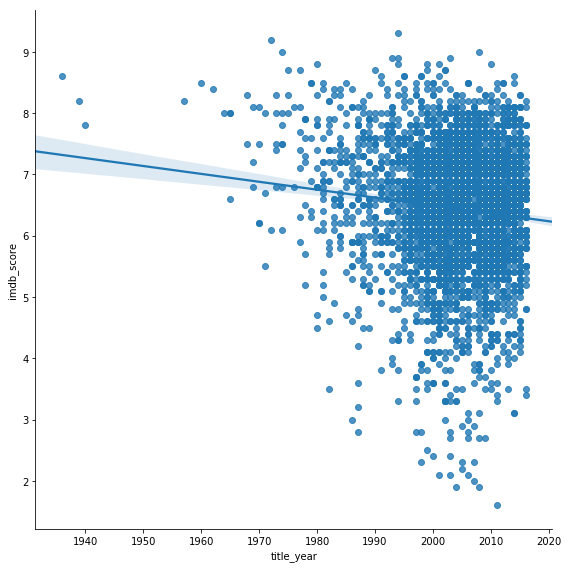

In [28]:
sns.lmplot("title_year", "imdb_score", df1, fit_reg=True, height=8)

* The current trend is that as more movies are being made, the lower the IMDB rating is.

### Analyzing the Top 20 Grossing Movies

In [29]:
df1 = df
# rearrange the dataframe using sort by descending
toptobottom = df1.sort_values('gross', ascending=- False)
# get top 20
top20 = toptobottom.head(20)
# get the rest
therest = toptobottom.iloc[20:]
# check the number of rows
print((len(toptobottom), len(top20), len(therest)))

(3726, 20, 3706)


In [30]:
# comparing two groups by mean
top20.mean() / therest.mean()

num_critic_for_reviews       2.948324
duration                     1.297383
director_facebook_likes      3.829852
actor_1_facebook_likes       2.468716
gross                        9.787670
num_voted_users              6.667414
cast_total_facebook_likes    3.718253
facenumber_in_poster         0.797301
num_user_for_reviews         5.309111
budget                       3.551778
title_year                   1.001020
imdb_score                   1.209153
aspect_ratio                 1.002396
movie_facebook_likes         7.155845
dtype: float64

In [31]:
top20.head(2)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,num_user_for_reviews,language,country,content_rating,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,imdbscores_bins
0,Color,James Cameron,723.0,178.0,0.0,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,3054.0,English,USA,PG-13,237000000.0,2009.0,7.9,1.78,33000,4
26,Color,James Cameron,315.0,194.0,0.0,29000.0,658672302.0,Drama|Romance,Leonardo DiCaprio,Titanic,...,2528.0,English,USA,PG-13,200000000.0,1997.0,7.7,2.35,26000,4


The top 20 movies average a much larger following on Facebook, gross, and in turn far more IMDB votes. However, on average, they only have a slightly better IMDB score.

In [32]:
top20.corr()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes
num_critic_for_reviews,1.000000,0.595309,0.249840,0.300991,0.401676,0.477820,0.603499,0.217389,0.336241,0.602426,0.729869,0.158547,0.188358,0.810467
duration,0.595309,1.000000,0.092395,0.508110,0.478496,0.389285,0.507222,0.192839,0.444006,0.573664,0.356465,-0.034472,0.430236,0.376438
director_facebook_likes,0.249840,0.092395,1.000000,0.009051,-0.076529,0.552742,0.260529,-0.332068,0.440378,0.025729,-0.071809,0.486118,0.187489,0.159070
actor_1_facebook_likes,0.300991,0.508110,0.009051,1.000000,-0.200444,0.223026,0.730392,0.283197,0.257376,0.392758,0.399698,-0.097708,0.630487,0.275015
gross,0.401676,0.478496,-0.076529,-0.200444,1.000000,0.388140,0.008328,-0.062620,0.397945,0.314753,0.127783,0.057438,-0.263894,0.167477
num_voted_users,0.477820,0.389285,0.552742,0.223026,0.388140,1.000000,0.397110,-0.071393,0.731241,0.190688,0.040725,0.616186,0.128416,0.175697
cast_total_facebook_likes,0.603499,0.507222,0.260529,0.730392,0.008328,0.397110,1.000000,0.353689,0.276024,0.596985,0.512579,0.181205,0.405666,0.588041
facenumber_in_poster,0.217389,0.192839,-0.332068,0.283197,-0.062620,-0.071393,0.353689,1.000000,-0.277014,0.386482,0.308149,-0.100678,0.010172,0.206203
num_user_for_reviews,0.336241,0.444006,0.440378,0.257376,0.397945,0.731241,0.276024,-0.277014,1.000000,0.245612,0.071767,0.107680,0.324131,-0.051124
budget,0.602426,0.573664,0.025729,0.392758,0.314753,0.190688,0.596985,0.386482,0.245612,1.000000,0.766283,0.006669,0.162605,0.299447


There are a few highly correlated variables. Looking at IMDB Score based on the number of voted users shows some interesting data.

In [33]:
px.scatter(top20,
           x="imdb_score",
           y="num_voted_users",
           labels={
               'imdb_score': 'IMDB Score',
               'num_voted_users': 'Number of IMDB Voters'
           },
           title='IMDB Score by Number of Voters',
           marginal_y="violin",
           marginal_x="box",
           trendline="ols")

In [34]:
top20.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,num_user_for_reviews,language,country,content_rating,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,imdbscores_bins
0,Color,James Cameron,723.0,178.0,0.0,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,3054.0,English,USA,PG-13,237000000.0,2009.0,7.9,1.78,33000,4
26,Color,James Cameron,315.0,194.0,0.0,29000.0,658672302.0,Drama|Romance,Leonardo DiCaprio,Titanic,...,2528.0,English,USA,PG-13,200000000.0,1997.0,7.7,2.35,26000,4
29,Color,Colin Trevorrow,644.0,124.0,365.0,3000.0,652177271.0,Action|Adventure|Sci-Fi|Thriller,Bryce Dallas Howard,Jurassic World,...,1290.0,English,USA,PG-13,150000000.0,2015.0,7.0,2.00,150000,3
794,Color,Joss Whedon,703.0,173.0,0.0,26000.0,623279547.0,Action|Adventure|Sci-Fi,Chris Hemsworth,The Avengers,...,1722.0,English,USA,PG-13,220000000.0,2012.0,8.1,1.85,123000,5
17,Color,Joss Whedon,703.0,173.0,0.0,26000.0,623279547.0,Action|Adventure|Sci-Fi,Chris Hemsworth,The Avengers,...,1722.0,English,USA,PG-13,220000000.0,2012.0,8.1,1.85,123000,5


In [35]:
top20.groupby('actor_1_name').size().sort_values(ascending=False).head()

actor_1_name
Chris Hemsworth      3
Robert Downey Jr.    2
Jennifer Lawrence    2
Tom Hardy            1
Tom Hanks            1
dtype: int64

The top 3 actors star in multiple top 20 movies. What about their popularity on Facebook?

In [36]:
top20.groupby('actor_1_name')['actor_1_facebook_likes'].sum().sort_values(
    ascending=False).head()

actor_1_name
Chris Hemsworth      78000.0
Jennifer Lawrence    68000.0
Robert Downey Jr.    42000.0
Johnny Depp          40000.0
Leonardo DiCaprio    29000.0
Name: actor_1_facebook_likes, dtype: float64

Those same top 3 are the top 3 most popular actors in the top 20 movies.

It also looks like duration correlates with the number of critical reviews.

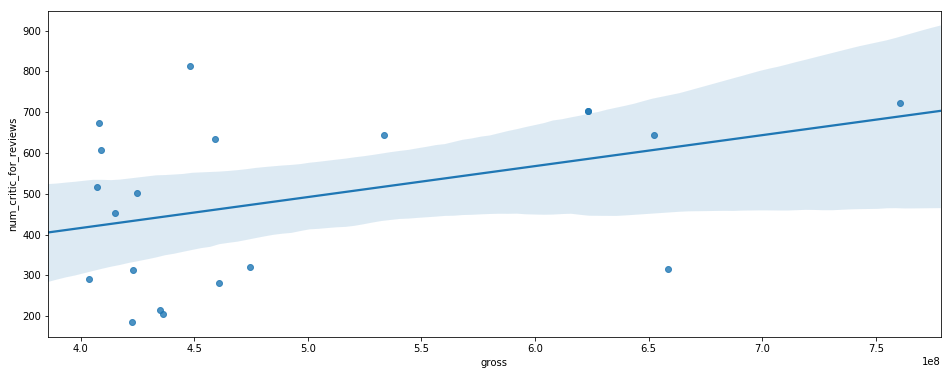

In [37]:
plt.figure(figsize=(16, 6))
sns.regplot(data=top20, x='gross', y='num_critic_for_reviews')

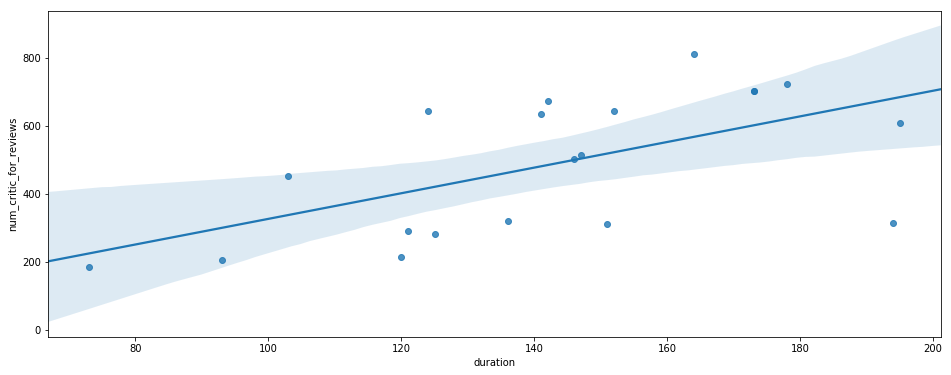

In [38]:
plt.figure(figsize=(16, 6))
sns.regplot(data=top20, x='duration', y='num_critic_for_reviews')

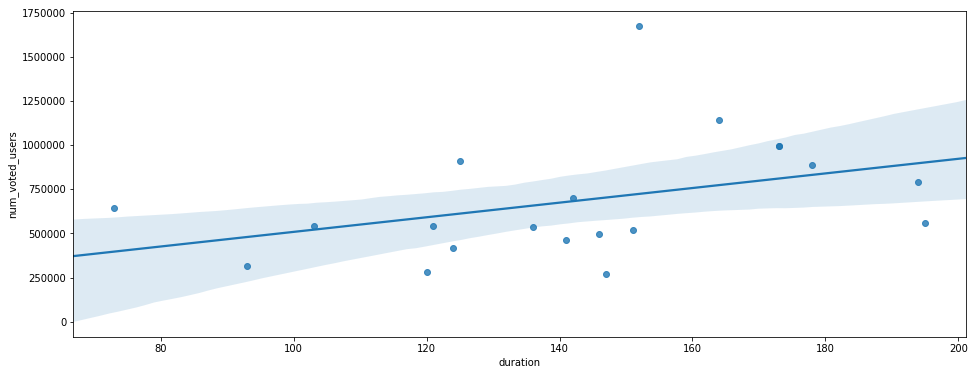

In [39]:
plt.figure(figsize=(16, 6))
sns.regplot(data=top20, x='duration', y='num_voted_users')

This is possibly due to the fact that usually more people vote on movies that are longer. This may be due to the fact that longer movies are higher in budget and are likely popular movies.

In [40]:
px.scatter(top20,
           x='duration',
           y='budget',
           labels={
               'duration': 'Movie Duration',
               'budget': 'Movie Budget in Dollars'
           },
           title='Movie Budget by Duration',
           trendline='ols',
           hover_name='movie_title')

Big budget films have increased over time, so they will inevitably be more popular with the amount of money being spent on them. Some visuals below look at this from other angles.

In [41]:
px.scatter(
    top20,
    x='title_year',
    y='budget',
    trendline='ols',
    labels={
        'title_year': 'Release Year',
        'budget': 'Movie Budget in Dollars'
    },
    title='Movie Budget by Release Year',
)

In [42]:
px.density_contour(
    top20,
    x='title_year',
    y='budget',
    trendline='ols',
    labels={
        'title_year': 'Release Year',
        'budget': 'Movie Budget in Dollars'
    },
    title='Movie Budget by Release Year Density Contour',
)

### The Facebook Effect - How Social Footprint Affects IMDB scores

In [43]:
df['total_production_facebook_likes'] = df.cast_total_facebook_likes + \
    df.director_facebook_likes + df.movie_facebook_likes
df.head(2)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,...,language,country,content_rating,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,imdbscores_bins,total_production_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,...,English,USA,PG-13,237000000.0,2009.0,7.9,1.78,33000,4,37834.0
1,Color,Gore Verbinski,302.0,169.0,563.0,40000.0,309404152.0,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,...,English,USA,PG-13,300000000.0,2007.0,7.1,2.35,0,4,48913.0


In [44]:
df.corr()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,total_production_facebook_likes
num_critic_for_reviews,1.000000,0.240520,0.175906,0.164181,0.467548,0.594588,0.235256,-0.035100,0.565677,0.105107,0.450125,0.355652,0.237539,0.704726,0.625580
duration,0.240520,1.000000,0.185630,0.087183,0.254162,0.348770,0.124693,0.022484,0.360235,0.070360,-0.118916,0.368634,0.206662,0.221364,0.239084
director_facebook_likes,0.175906,0.185630,1.000000,0.088365,0.138518,0.300571,0.117333,-0.048022,0.217619,0.017930,-0.060235,0.195921,0.047383,0.162017,0.272765
actor_1_facebook_likes,0.164181,0.087183,0.088365,1.000000,0.140991,0.176741,0.944767,0.061938,0.119168,0.015225,0.091979,0.098826,0.072776,0.128573,0.655052
gross,0.467548,0.254162,0.138518,0.140991,1.000000,0.626746,0.232632,-0.030634,0.545825,0.099041,0.048890,0.223239,0.080684,0.368467,0.396620
num_voted_users,0.594588,0.348770,0.300571,0.176741,0.626746,1.000000,0.246749,-0.034678,0.779138,0.065932,0.019574,0.487322,0.110730,0.518212,0.520119
cast_total_facebook_likes,0.235256,0.124693,0.117333,0.944767,0.232632,0.246749,1.000000,0.084629,0.176066,0.027381,0.123705,0.113378,0.087936,0.204058,0.740859
facenumber_in_poster,-0.035100,0.022484,-0.048022,0.061938,-0.030634,-0.034678,0.084629,1.000000,-0.083153,-0.021816,0.092237,-0.065693,0.031471,0.016065,0.056378
num_user_for_reviews,0.565677,0.360235,0.217619,0.119168,0.545825,0.779138,0.176066,-0.083153,1.000000,0.070300,0.011946,0.330690,0.128670,0.370609,0.371988
budget,0.105107,0.070360,0.017930,0.015225,0.099041,0.065932,0.027381,-0.021816,0.070300,1.000000,0.045085,0.032055,0.031454,0.052302,0.052784


In [45]:
px.scatter(df.sample(500),
           x="imdb_score",
           y="actor_1_facebook_likes",
           hover_name='movie_title',
           labels={
               'imdb_score': 'IMDB Score',
               'actor_1_facebook_likes': 'Main Actor Facebook Likes'
           },
           title='IMDB Score by Main Actor Facebook Likes',
           trendline='ols')

In [46]:
px.scatter(df.sample(500),
           x="imdb_score",
           y="total_production_facebook_likes",
           hover_name='movie_title',
           labels={
               'imdb_score':
               'IMDB Score',
               'total_production_facebook_likes':
               'Combined Facebook Likes (Dir, Movie, Cast)'
           },
           title='IMDB Score by Combined Facebook Likes',
           trendline='ols')

There appears to be a slight correlation between IMDB score and Facebook likes.

### IMDB Scores Based on Country and Language

In [47]:
px.scatter(df,
           x='imdb_score',
           y='gross',
           hover_data=['movie_title', 'budget'],
           color='language',
           labels={
               'imdb_score': 'IMDB Score',
               'gross': 'Gross earnings in Dollars'
           },
           title='Gross Earnings by IMDB Score, Language',
           height=600)

English is extremely well received in terms of gross earnings. This may be due to the fact that it is a universally accepted language and the most popular films are in English.

In [48]:
px.scatter(df,
           x='imdb_score',
           y='gross',
           hover_data=['movie_title', 'budget'],
           color='country',
           labels={
               'imdb_score': 'IMDB Score',
               'gross': 'Gross earnings in Dollars'
           },
           title='Gross Earnings by IMDB Score, Production Country',
           height=600)

USA produced movies dominate this chart by sheer numbers, but UK movies appear to be well received by critics as well as other countries.

In [49]:
df.groupby('country')['imdb_score'].mean().sort_values(ascending=False)

country
others       7.052532
UK           6.831169
France       6.778125
Australia    6.435897
USA          6.377384
Germany      6.278481
Canada       6.207018
Name: imdb_score, dtype: float64

In fact, on average, nations other than the biggest producers average a significantly higher IMDB score!

In [50]:
df.groupby('country')['gross'].mean().round().sort_values(ascending=False)

country
USA          58450069.0
Australia    43155668.0
UK           36654397.0
Germany      30401962.0
Canada       27624154.0
others       20882455.0
France       20253753.0
Name: gross, dtype: float64

The biggest drawback for producing in other nations is their lack of profit from movies.

### IMDB Scores Based on Genres

In [51]:
px.violin(df.sort_values('content_rating'),
          x="content_rating",
          y="num_voted_users",
          hover_name='movie_title',
          labels={
              'num_voted_users': 'Number of Users Who Voted',
              'content_rating': 'Content Rating'
          },
          title='Gross Earnings by Content Rating',
          box=True,
          points='all')

In [52]:
# create a new data frame
g = df[['genres', 'imdb_score', 'gross']]
# check your new data frame
g.head()

,genres,imdb_score,gross
0,Action|Adventure|Fantasy|Sci-Fi,7.9,760505847.0
1,Action|Adventure|Fantasy,7.1,309404152.0
2,Action|Adventure|Thriller,6.8,200074175.0
3,Action|Thriller,8.5,448130642.0
5,Action|Adventure|Sci-Fi,6.6,73058679.0


In [53]:
# check how many rows
len(g)

3726

In [54]:
# now, separate a string of genres into multiple rows
# I borrowed the code below from https://stackoverflow.com/questions/12680754/split-explode-pandas-dataframe-string-entry-to-separate-rows
b = pd.DataFrame(g.genres.str.split('|').tolist(), index=g.imdb_score).stack()
b = b.reset_index()[[0,
                     'imdb_score']]  # genres variable is currently labeled 0
b.columns = ['genres', 'imdb_score']  # renaming genres
b.head()

,genres,imdb_score
0,Action,7.9
1,Adventure,7.9
2,Fantasy,7.9
3,Sci-Fi,7.9
4,Action,7.1


In [55]:
# create new df based on genre imdb mean.
b_group = b.groupby('genres').mean().sort_values(by='imdb_score')
# reset index to visualize
b_group = b_group.reset_index()

In [56]:
px.bar(
    b_group,
    x='genres',
    y='imdb_score',
    labels={
        'genres': 'Movie Genres',
        'imdb_score': 'IMDB Score'
    },
    title='IMDB Score by Genre',
)

In [57]:
px.scatter(
    b_group,
    x='genres',
    y='imdb_score',
    labels={
        'genres': 'Movie Genre',
        'imdb_score': 'IMDB Score'
    },
    title='IMDB Score by Movie Genre',
)

In [58]:
b.groupby('genres').size().sort_values(ascending=False)

genres
Drama          1877
Comedy         1460
Thriller       1106
Action          952
Romance         850
Adventure       775
Crime           701
Fantasy         502
Sci-Fi          495
Family          440
Mystery         385
Horror          382
Biography       234
Animation       195
Music           157
War             150
Sport           150
History         146
Musical          84
Western          55
Documentary      45
dtype: int64

Horror movies seem to have the worst scores while non-fictional or event-based works (Biography, History, War, and Documentary) are very highly rated. This could be due to the volume of horror movies or people feeling more connected to real stories.

### IMDB Scores Based on Content Rating

How does content rating affect a movie's success?

In [59]:
# px.box(
#    df,
#    x="content_rating",
#   y="imdb_score",
#    labels={
#       'imdb_score': 'IMDB Score',
#       'content_rating': 'Movie Rating'
#    },
#   title='IMDB Score by Gross Earnings, Language',
#   )

px.violin(df.sort_values('content_rating'),
          x="content_rating",
          y="imdb_score",
          hover_name='movie_title',
          labels={
              'imdb_score': 'IMDB Score',
              'content_rating': 'Content Rating'
          },
          title='IMDB Score by Content Rating',
          box=True,
          points="all")

Overall, more mature content is rated higher. This could be due to the creative freedom of a director to tell a story.

In [60]:
px.violin(
    df.sort_values('content_rating'),
    x="content_rating",
    y="gross",
    hover_name='movie_title',
    labels={
        'gross': 'Gross earnings in Dollars',
        'content_rating': 'Content Rating'
    },
    title='Gross Earnings by Content Rating',
    box=True,
)

In [61]:
px.violin(
    df.sort_values('content_rating'),
    x="content_rating",
    y="budget",
    hover_name='movie_title',
    labels={
        'budget': 'Movie Budget in Dollars',
        'content_rating': 'Content Rating'
    },
    title='Budget by Content Rating',
    box=True,
)

In [62]:
# most movies are R rated
df.groupby('content_rating').size().sort_values(ascending=False)

content_rating
R        1723
PG-13    1321
PG        573
G          91
NC-17      18
dtype: int64

In [63]:
# more users reviewed R
df.groupby('content_rating')['num_user_for_reviews'].sum().sort_values(
    ascending=False).head()

content_rating
R        574335.0
PG-13    515528.0
PG       140084.0
G         20006.0
NC-17      5657.0
Name: num_user_for_reviews, dtype: float64

In [64]:
# more voted for R movies
df.groupby('content_rating')['num_voted_users'].sum().sort_values(
    ascending=False).head()

content_rating
R        178697056
PG-13    156643060
PG        48610161
G          9444188
NC-17      1048837
Name: num_voted_users, dtype: int64

In [65]:
# more critical reviews of R movies
df.groupby('content_rating')['num_critic_for_reviews'].sum().sort_values(
    ascending=False).head()

content_rating
R        288846.0
PG-13    243141.0
PG        76618.0
G         10643.0
NC-17      2963.0
Name: num_critic_for_reviews, dtype: float64

In [66]:
# more facebook likes for PG-13
df.groupby('content_rating')['movie_facebook_likes'].sum().sort_values(
    ascending=False).head()

content_rating
PG-13    15727566
R        14968728
PG        3848229
G          370927
NC-17       47938
Name: movie_facebook_likes, dtype: int64

It's interesting that PG-13 movies have almost double the gross earnings of R rated movies, especially when R movies have more reviewers and many more movies. The budgets are much higher for R movies though, and it may be tough for them to stand out since there are so many more. This would seem to indicate a number of R movies don't gross much because the market may be too saturated while PG-13 can appeal to a much wider audience. Looking at age groups that attend movies would give us a better understanding of what ages see movies most often, I would generally expect teenagers to be the largest demographic just looking at this data.

## Midterm Project - Business Intelligence and Final Thoughts

Highly Rated Movie Characteristics:
* Actors with higher Facebook following
* Big budget, around $250MM
* PG-13 or R rated content is the most ideal for audiences
* Falls into a "truth-based" genre (History, war, biography)
* Produced in the US with English as the language

Highly rated IMDB movies share these things in common. The average person that is going to movies is expecting high quality acting with developed stories they can relate to.

# IMDB Final Project

In [67]:
# import packages

# regression packages
import sklearn.linear_model as lm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import explained_variance_score

# f_regression (feature selection)
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest

# recursive feature selection (feature selection)
from sklearn.feature_selection import RFE

import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.api as sm
from statsmodels.formula.api import ols

import warnings
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# statistical testing
from scipy import stats
import pingouin as pg

import plotly.graph_objects as go
import plotly.express as px

## 4. Regression Analysis

In [68]:
# looking at the mean values of the dataset

df.mean().round().sort_values(ascending=False)

gross                              52844874.0
budget                             46599591.0
num_voted_users                      105862.0
total_production_facebook_likes       21855.0
cast_total_facebook_likes             11661.0
movie_facebook_likes                   9384.0
actor_1_facebook_likes                 7850.0
title_year                             2003.0
director_facebook_likes                 810.0
num_user_for_reviews                    337.0
num_critic_for_reviews                  167.0
duration                                110.0
imdb_score                                6.0
aspect_ratio                              2.0
facenumber_in_poster                      1.0
dtype: float64

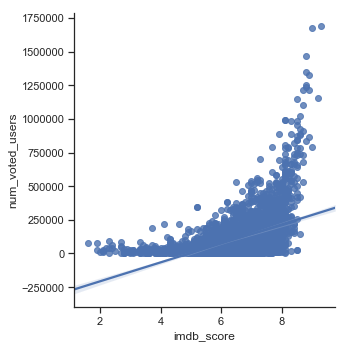

In [69]:
# exploratory visualization of imdb score vs number of voters

sns.lmplot('imdb_score', 'num_voted_users', data=df, fit_reg=True)

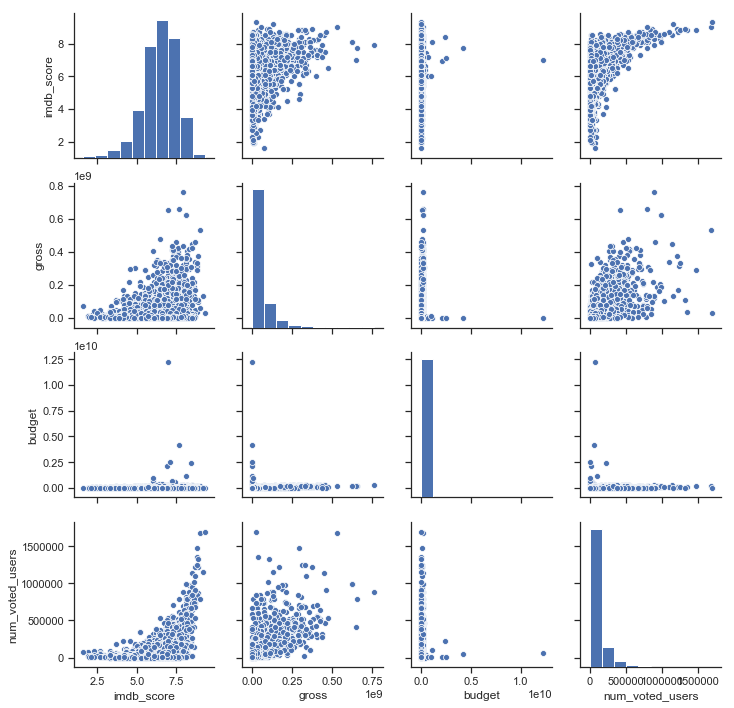

In [70]:
#exploratory pairplot

sns.pairplot(df, vars=["imdb_score", "gross", "budget", "num_voted_users"])

In [71]:
# checking correlations between X and y values
corr = pd.DataFrame(df.corr()['imdb_score'].drop('imdb_score'))
corr.sort_values(['imdb_score'], ascending=False)

,imdb_score
num_voted_users,0.487322
duration,0.368634
num_critic_for_reviews,0.355652
num_user_for_reviews,0.330690
movie_facebook_likes,0.285203
total_production_facebook_likes,0.275842
gross,0.223239
director_facebook_likes,0.195921
cast_total_facebook_likes,0.113378
actor_1_facebook_likes,0.098826


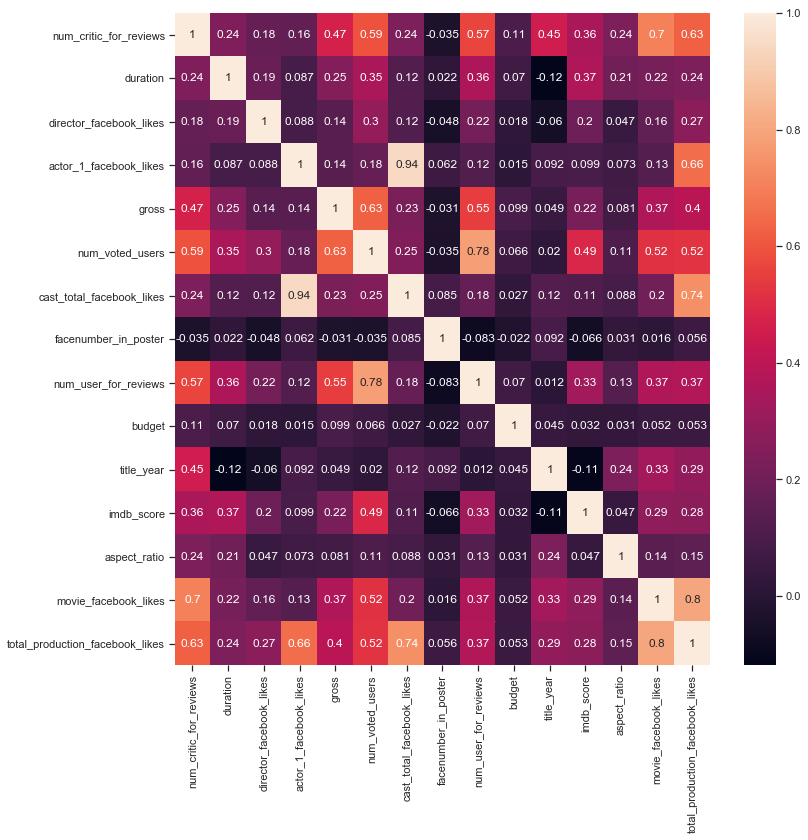

In [72]:
# heatmap for correlation
plt.figure(figsize=(12, 12))
sns.heatmap(df.corr(), annot=True)

#### Correlation Analysis

* Gross Earnings is correlated with Facebook likes in all categories
* IMDB Score is highly correlated with number of voters, number of critical reviews, and duration.
* Number of voters is also highly correlated with gross earnings.

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 25 columns):
color                              3726 non-null object
director_name                      3726 non-null object
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
genres                             3726 non-null object
actor_1_name                       3726 non-null object
movie_title                        3726 non-null object
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
plot_keywords                      3726 non-null object
num_user_for_reviews               3726 non-null float64
language                           3726 non-null

In [74]:
# dropping unneeded columns for regression analysis

df_reg = df.drop([
    'color', 'language', 'content_rating', 'aspect_ratio', 'genres', 'country',
    'director_name', 'actor_1_name', 'movie_title', 'plot_keywords',
    'imdbscores_bins'
],
                 axis=1)
df_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 14 columns):
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
budget                             3726 non-null float64
title_year                         3726 non-null float64
imdb_score                         3726 non-null float64
movie_facebook_likes               3726 non-null int64
total_production_facebook_likes    3726 non-null float64
dtypes: float64(11), int64(3)
memory usage: 596.6 KB


In [75]:
# assigning columns to X and Y variables
y = df_reg['imdb_score']
X = df_reg.drop(['imdb_score'], axis=1)

# Fit the model below

model1 = lm.Lasso()
model1.fit(X, y)
model1_y = model1.predict(X)

# print the coefficients
coef = ["%.9f" % i for i in model1.coef_]
xcolumns = [i for i in X.columns]
list(zip(xcolumns, coef))

[('num_critic_for_reviews', '0.001701900'),
 ('duration', '0.009111534'),
 ('director_facebook_likes', '0.000008746'),
 ('actor_1_facebook_likes', '0.000011213'),
 ('gross', '-0.000000002'),
 ('num_voted_users', '0.000003963'),
 ('cast_total_facebook_likes', '-0.000009722'),
 ('facenumber_in_poster', '-0.000000000'),
 ('num_user_for_reviews', '-0.000503446'),
 ('budget', '-0.000000000'),
 ('title_year', '-0.005483526'),
 ('movie_facebook_likes', '-0.000002209'),
 ('total_production_facebook_likes', '-0.000000001')]

In [76]:

pd.DataFrame(list(zip(X.columns, np.transpose(model1.coef_)))).sort_values(
    by=1, ascending=False).reset_index(drop=True)

,0,1
0,duration,9.111534e-03
1,num_critic_for_reviews,1.701900e-03
2,actor_1_facebook_likes,1.121255e-05
3,director_facebook_likes,8.746498e-06
4,num_voted_users,3.962522e-06
5,facenumber_in_poster,-0.000000e+00
6,budget,-3.058819e-11
7,total_production_facebook_likes,-5.243799e-10
8,gross,-2.041810e-09
9,movie_facebook_likes,-2.209123e-06


In [77]:
# printing MSE and R Sq for the first model
print(("mean square error: ", mean_squared_error(y, model1_y)))
print(("variance or r-squared: ", explained_variance_score(y, model1_y)))

('mean square error: ', 0.7452488448819532)
('variance or r-squared: ', 0.33314104820022716)


In [78]:
# select only X variables
X_new = SelectKBest(f_regression, k=4).fit_transform(X, y)
X_new

array([[7.23000e+02, 1.78000e+02, 8.86204e+05, 3.05400e+03],
       [3.02000e+02, 1.69000e+02, 4.71220e+05, 1.23800e+03],
       [6.02000e+02, 1.48000e+02, 2.75868e+05, 9.94000e+02],
       ...,
       [1.43000e+02, 7.70000e+01, 7.26390e+04, 3.71000e+02],
       [5.60000e+01, 8.10000e+01, 5.20550e+04, 1.30000e+02],
       [4.30000e+01, 9.00000e+01, 4.28500e+03, 8.40000e+01]])

In [79]:
# KBest index selections
selector = SelectKBest(f_regression, k=4).fit(X_new, y)
idxs_selected = selector.get_support(indices=True)
print(idxs_selected)

[0 1 2 3]


In [80]:
# building model 2 for linear regression from the two variables above

model2 = lm.LinearRegression()
model2.fit(X_new, y)
model2_y = model2.predict(X_new)

print(("mean square error: ", mean_squared_error(y, model2_y)))
print(("variance or r-squared: ", explained_variance_score(y, model2_y)))

('mean square error: ', 0.7775989290777031)
('variance or r-squared: ', 0.30419374638880425)


### Model comparison

In [81]:
df_reg.columns

Index(['num_critic_for_reviews', 'duration', 'director_facebook_likes',
       'actor_1_facebook_likes', 'gross', 'num_voted_users',
       'cast_total_facebook_likes', 'facenumber_in_poster',
       'num_user_for_reviews', 'budget', 'title_year', 'imdb_score',
       'movie_facebook_likes', 'total_production_facebook_likes'],
      dtype='object')

In [82]:
# First Model
df_reg_model = ols(
    "imdb_score~num_critic_for_reviews+duration+director_facebook_likes+actor_1_facebook_likes+gross+num_voted_users+cast_total_facebook_likes+facenumber_in_poster+num_user_for_reviews+budget+title_year+imdb_score+movie_facebook_likes+total_production_facebook_likes",
    df_reg)
df_reg_fit = df_reg_model.fit()
# Second Model
df_reg_model2 = ols("imdb_score~num_critic_for_reviews+facenumber_in_poster",
                    df_reg)
df_reg_fit2 = df_reg_model2.fit()

print((df_reg_fit.summary()))
print((df_reg_fit2.summary()))

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.802e+21
Date:                Tue, 10 Dec 2019   Prob (F-statistic):               0.00
Time:                        23:20:36   Log-Likelihood:                 75976.
No. Observations:                3726   AIC:                        -1.519e+05
Df Residuals:                    3712   BIC:                        -1.518e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

**Model Comparison**

* The second model is much more accurate overall and shows that all variables are significant to predicting IMDB score. It also eliminates the multicollinearity issues found with the first model.


In [83]:
print((np.linalg.cond(df_reg_fit.model.exog)))
print((np.linalg.cond(df_reg_fit2.model.exog)))
print(("y-intercept ", model2.intercept_))

7.861531957747373e+18
381.9135637961304
('y-intercept ', 4.827238500976127)


### Random Forest Regressor - Feature Selection

In [84]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

# assigning columns to X and Y variables
y = df_reg['imdb_score']
X = df_reg.drop(['imdb_score'], axis=1)

regr = RandomForestRegressor()
regr.fit(X, y)
regr_predicted = regr.predict(X)

print(("mean square error: ", mean_squared_error(y, regr_predicted)))
print(("variance or r-squared: ", explained_variance_score(y, regr_predicted)))

/Users/Derek/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



('mean square error: ', 0.09678132045088568)
('variance or r-squared: ', 0.91349920062363)


In [85]:
sorted(zip(regr.feature_importances_, X.columns))

[(0.02160372642673168, 'facenumber_in_poster'),
 (0.02557491608525812, 'actor_1_facebook_likes'),
 (0.028615480218086152, 'total_production_facebook_likes'),
 (0.03379918054211863, 'movie_facebook_likes'),
 (0.03920607638492338, 'director_facebook_likes'),
 (0.040267701723288286, 'cast_total_facebook_likes'),
 (0.044189657151753346, 'title_year'),
 (0.05173727739967625, 'num_critic_for_reviews'),
 (0.06927965913940169, 'gross'),
 (0.074342862226703, 'num_user_for_reviews'),
 (0.11326929869753959, 'budget'),
 (0.11646963695338487, 'duration'),
 (0.34164452705113485, 'num_voted_users')]

In [86]:
y = df_reg['imdb_score']
X_new2 = df_reg.drop(['imdb_score', 'num_voted_users', 'duration'], axis=1)

regr = RandomForestRegressor()
regr.fit(X_new2, y)
regr_predicted = regr.predict(X_new2)

print(("mean square error: ", mean_squared_error(y, regr_predicted)))
print(("variance or r-squared: ", explained_variance_score(y, regr_predicted)))

/Users/Derek/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



('mean square error: ', 0.12079063338701021)
('variance or r-squared: ', 0.8919494760058878)


In [87]:
sorted(zip(regr.feature_importances_, X_new2.columns))

[(0.022423926077908704, 'facenumber_in_poster'),
 (0.03647500353604476, 'actor_1_facebook_likes'),
 (0.04378531692829005, 'cast_total_facebook_likes'),
 (0.05251221140970515, 'total_production_facebook_likes'),
 (0.0697475591282668, 'director_facebook_likes'),
 (0.08930500279964883, 'budget'),
 (0.10650976745815376, 'gross'),
 (0.1270956965847751, 'title_year'),
 (0.13153214701702437, 'num_critic_for_reviews'),
 (0.15540308132827851, 'num_user_for_reviews'),
 (0.1652102877319041, 'movie_facebook_likes')]

### Linear Regression

In [88]:
model3 = lm.LinearRegression()
model3.fit(X_new2, y)
model3_y = model3.predict(X_new2)

print(("mean square error: ", mean_squared_error(y, model3_y)))
print(("variance or r-squared: ", explained_variance_score(y, model3_y)))

('mean square error: ', 0.8566438524111887)
('variance or r-squared: ', 0.23346325806767032)


## Classification Model

In [89]:
# Classifiers
#import decisiontreeclassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
# import logisticregression classifier
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
# import knn classifier
from sklearn.neighbors import KNeighborsClassifier

# for validating your classification model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

# feature selection
from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 25 columns):
color                              3726 non-null object
director_name                      3726 non-null object
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
genres                             3726 non-null object
actor_1_name                       3726 non-null object
movie_title                        3726 non-null object
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
plot_keywords                      3726 non-null object
num_user_for_reviews               3726 non-null float64
language                           3726 non-null

### Transforming data, cleaning out unnecessary columns, creating dummies

In [91]:
df_class = df.drop([
    'director_name', 'actor_1_name', 'movie_title', 'plot_keywords',
    'imdbscores_bins'
],
                   axis=1)

In [92]:
df_class.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 20 columns):
color                              3726 non-null object
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
genres                             3726 non-null object
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
language                           3726 non-null object
country                            3726 non-null object
content_rating                     3726 non-null object
budget                             3726 non-null float64
title_year                         3726 non-nul

In [93]:
df_class = df_class.join(df_class.pop('genres').str.get_dummies('|'))

In [94]:
df_class.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 40 columns):
color                              3726 non-null object
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
language                           3726 non-null object
country                            3726 non-null object
content_rating                     3726 non-null object
budget                             3726 non-null float64
title_year                         3726 non-null float64
imdb_score                         3726 non-nu

In [95]:
# generating dummy variables for objects

df_class = pd.get_dummies(
    df_class,
    columns=["color", "language", "country", "content_rating"],
    prefix=["color", "language", "country", "content_rating"],
    drop_first=True)
df_class.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 48 columns):
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
budget                             3726 non-null float64
title_year                         3726 non-null float64
imdb_score                         3726 non-null float64
aspect_ratio                       3726 non-null float64
movie_facebook_likes               3726 non-null int64
total_production_facebook_likes    3726 non-null float64
Action                             3726 non-

In [96]:
# binning the scores to analyze them

df_class['imdb_score_bins'] = pd.cut(df_class['imdb_score'],
                                     bins=[0, 4, 6, 8,
                                           float('Inf')],
                                     labels=['0', '1', '2', '3'])
df_class.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 49 columns):
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
budget                             3726 non-null float64
title_year                         3726 non-null float64
imdb_score                         3726 non-null float64
aspect_ratio                       3726 non-null float64
movie_facebook_likes               3726 non-null int64
total_production_facebook_likes    3726 non-null float64
Action                             3726 non-

In [97]:
# dropping IMDB score from the dataset

df_class = df_class.drop(['imdb_score'], axis=1)

### Decision Tree Classifier

In [98]:
# declare X variables and y variable
y_dt = df_class['imdb_score_bins']
X_dt = df_class.drop(['imdb_score_bins'], axis=1)

# split validation
X_train, X_test, y_train, y_test = train_test_split(X_dt,
                                                    y_dt,
                                                    test_size=0.3,
                                                    random_state=0)

# Initialize DecisionTreeClassifier() ... name your decision model "dt"
dt = DecisionTreeClassifier()

# Train a decision tree model
dt.fit(X_train, y_train)

print((metrics.accuracy_score(y_test, dt.predict(X_test))))
print("--------------------------------------------------------")
print((metrics.confusion_matrix(y_test, dt.predict(X_test))))
print("--------------------------------------------------------")
print((metrics.classification_report(y_test, dt.predict(X_test))))

0.7164579606440071
--------------------------------------------------------
[[  8  13   5   0]
 [ 21 175 109   0]
 [ 14 127 584  13]
 [  0   1  14  34]]
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.19      0.31      0.23        26
           1       0.55      0.57      0.56       305
           2       0.82      0.79      0.81       738
           3       0.72      0.69      0.71        49

    accuracy                           0.72      1118
   macro avg       0.57      0.59      0.58      1118
weighted avg       0.73      0.72      0.72      1118



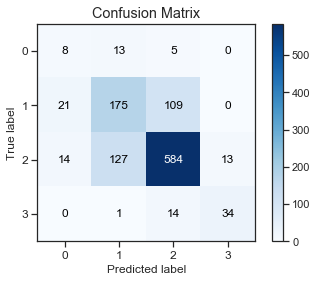

In [99]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_true=np.array(y_test),
                                    y_pred=dt.predict(X_test))
plt.show()

* Decision Tree predicted most clusters fairly accurately. There is a little bit of overlap between the clusters as evident by the high numbers nearest the true labels.

### KNN

In [100]:
# split validation
X_train, X_test, y_train, y_test = train_test_split(X_dt,
                                                    y_dt,
                                                    test_size=0.3,
                                                    random_state=0)

# Initialize DecisionTreeClassifier() ... name your decision model "dt"
knn = KNeighborsClassifier()

# Train a decision tree model
knn.fit(X_train, y_train)

print((metrics.accuracy_score(y_test, knn.predict(X_test))))
print("--------------------------------------------------------")
print((metrics.confusion_matrix(y_test, knn.predict(X_test))))
print("--------------------------------------------------------")
print((metrics.classification_report(y_test, knn.predict(X_test))))
print("--------------------------------------------------------")

0.6127012522361359
--------------------------------------------------------
[[  0   4  22   0]
 [  3  95 207   0]
 [  6 139 587   6]
 [  0   6  40   3]]
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        26
           1       0.39      0.31      0.35       305
           2       0.69      0.80      0.74       738
           3       0.33      0.06      0.10        49

    accuracy                           0.61      1118
   macro avg       0.35      0.29      0.30      1118
weighted avg       0.57      0.61      0.59      1118

--------------------------------------------------------


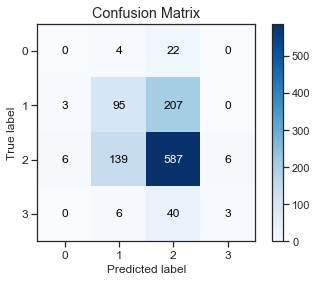

In [101]:
skplt.metrics.plot_confusion_matrix(y_true=np.array(y_test),
                                    y_pred=knn.predict(X_test))
plt.show()

* KNN predicted most of Cluster 2 and 3 acceptably, but Cluster 1 and 4 were not accurate at all.

### Logistic Regression

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X_dt,
                                                    y_dt,
                                                    test_size=0.3,
                                                    random_state=0)
lr = LogisticRegression(solver='lbfgs', max_iter=500)
lr.fit(X_train, y_train)

/Users/Derek/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=500,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [103]:
# Model evaluation

print((metrics.accuracy_score(y_test, lr.predict(X_test))))
print((metrics.confusion_matrix(y_test, lr.predict(X_test))))
print((metrics.classification_report(y_test, lr.predict(X_test))))


0.6815742397137746
[[  0   0  26   0]
 [  0  10 295   0]
 [  0   6 730   2]
 [  0   0  27  22]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        26
           1       0.62      0.03      0.06       305
           2       0.68      0.99      0.80       738
           3       0.92      0.45      0.60        49

    accuracy                           0.68      1118
   macro avg       0.55      0.37      0.37      1118
weighted avg       0.66      0.68      0.57      1118



/Users/Derek/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



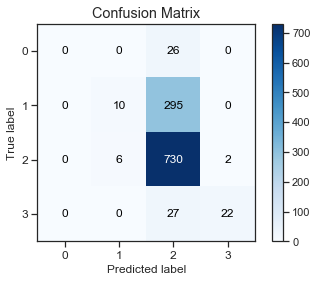

In [104]:
skplt.metrics.plot_confusion_matrix(y_true=np.array(y_test),
                                    y_pred=lr.predict(X_test))
plt.show()

* Logistic Regression predicted Cluster 3 very accurately, however it was off on most other classifications.

### Random Forest Classifier

In [105]:
clf = RandomForestClassifier(n_estimators=20)  # building 20 decision trees
clf = clf.fit(X_train, y_train)
clf.score(X_test, y_test)

# generate evaluation metrics
print((metrics.accuracy_score(y_test,
                              clf.predict(X_test))))  # overall accuracy
print((metrics.confusion_matrix(y_test, clf.predict(X_test))))
print((metrics.classification_report(y_test, clf.predict(X_test))))

0.778175313059034
[[  1  18   7   0]
 [  0 172 133   0]
 [  0  57 679   2]
 [  0   0  31  18]]
              precision    recall  f1-score   support

           0       1.00      0.04      0.07        26
           1       0.70      0.56      0.62       305
           2       0.80      0.92      0.86       738
           3       0.90      0.37      0.52        49

    accuracy                           0.78      1118
   macro avg       0.85      0.47      0.52      1118
weighted avg       0.78      0.78      0.76      1118



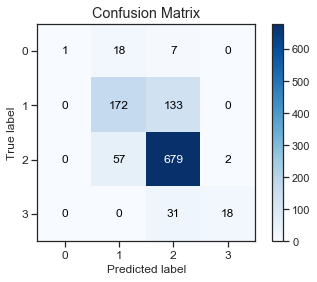

In [106]:
skplt.metrics.plot_confusion_matrix(y_true=np.array(y_test),
                                    y_pred=clf.predict(X_test))
plt.show()

* Random Forest predicted all clusters very accurately, however it was mostly wrong for Cluster 1. This is highly accurate and the difference between Cluster 1 and Cluster 2 is small.

### Comparing model accuracy

In [107]:
print(("Decision Tree: ", (metrics.accuracy_score(y_test,
                                                  dt.predict(X_test)))))
print(
    ("K Nearest Neighbors: ", (metrics.accuracy_score(y_test,
                                                      knn.predict(X_test)))))
print(
    ("Logistic Regression: ", (metrics.accuracy_score(y_test,
                                                      lr.predict(X_test)))))
print(("Random Forest: ", (metrics.accuracy_score(y_test,
                                                  clf.predict(X_test)))))

('Decision Tree: ', 0.7164579606440071)
('K Nearest Neighbors: ', 0.6127012522361359)
('Logistic Regression: ', 0.6815742397137746)
('Random Forest: ', 0.778175313059034)


**Model Comparison**

 * Random Forest was by far the most accurate model at 78% accurate in predicting IMDB Score. However, I noticed that the decision tree had a "smooth" transition between accurate predictions and incorrect ones - it also correctly predicted the most movies that were in Cluster 1. 

## Clustering Analysis

In [108]:
#import packages

import warnings
from scipy.cluster.hierarchy import dendrogram, linkage, ward
from sklearn.cluster import ward_tree
from sklearn.metrics import pairwise_distances
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

%matplotlib inline

warnings.filterwarnings("ignore")

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 25 columns):
color                              3726 non-null object
director_name                      3726 non-null object
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
genres                             3726 non-null object
actor_1_name                       3726 non-null object
movie_title                        3726 non-null object
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
plot_keywords                      3726 non-null object
num_user_for_reviews               3726 non-null float64
language                           3726 non-null

### Transforming and cleaning data

In [110]:
dfC = df.drop([
    'director_name', 'actor_1_name', 'movie_title', 'plot_keywords',
    'imdbscores_bins', 'genres', 'language', 'content_rating', 'country',
    'color'
],
              axis=1)
dfC.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3726 entries, 0 to 5042
Data columns (total 15 columns):
num_critic_for_reviews             3726 non-null float64
duration                           3726 non-null float64
director_facebook_likes            3726 non-null float64
actor_1_facebook_likes             3726 non-null float64
gross                              3726 non-null float64
num_voted_users                    3726 non-null int64
cast_total_facebook_likes          3726 non-null int64
facenumber_in_poster               3726 non-null float64
num_user_for_reviews               3726 non-null float64
budget                             3726 non-null float64
title_year                         3726 non-null float64
imdb_score                         3726 non-null float64
aspect_ratio                       3726 non-null float64
movie_facebook_likes               3726 non-null int64
total_production_facebook_likes    3726 non-null float64
dtypes: float64(12), int64(3)
memory usage: 

In [111]:
# Variance Testing

dfC.var()

num_critic_for_reviews             1.540561e+04
duration                           4.972538e+02
director_facebook_likes            9.486055e+06
actor_1_facebook_likes             2.436782e+08
gross                              4.964685e+15
num_voted_users                    2.323006e+10
cast_total_facebook_likes          3.688324e+08
facenumber_in_poster               4.196559e+00
num_user_for_reviews               1.703795e+05
budget                             5.147962e+16
title_year                         7.740435e+01
imdb_score                         1.117851e+00
aspect_ratio                       7.052184e-02
movie_facebook_likes               4.634553e+08
total_production_facebook_likes    1.045873e+09
dtype: float64

In [112]:
# normalize data and save as X

X_norm = (dfC - dfC.mean()) / (dfC.max() - dfC.min())
X_norm.head()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,total_production_facebook_likes
0,0.685584,0.231910,-0.035232,-0.010703,0.930514,0.461818,-0.010395,-0.032050,0.537172,0.015587,0.070417,0.188343,-0.211684,0.067669,0.024322
1,0.166471,0.201193,-0.010754,0.050234,0.337354,0.216224,0.055867,-0.032050,0.178136,0.020744,0.045417,0.084447,0.149076,-0.026887,0.041186
2,0.536385,0.129521,-0.035232,0.004922,0.193594,0.100612,0.000060,-0.008794,0.129896,0.016242,0.145417,0.045486,0.149076,0.216666,0.113922
3,0.796558,0.184128,0.921290,0.029922,0.519767,0.614585,0.144806,-0.032050,0.467381,0.016651,0.107917,0.266265,0.149076,0.443027,0.412344
5,0.363759,0.074913,-0.014580,-0.011266,0.026579,0.062935,-0.014904,-0.008794,0.079283,0.017773,0.107917,0.019512,0.149076,0.041881,0.006839


In [113]:
X_norm.var()

num_critic_for_reviews             0.023423
duration                           0.005792
director_facebook_likes            0.017932
actor_1_facebook_likes             0.000595
gross                              0.008584
num_voted_users                    0.008136
cast_total_facebook_likes          0.000855
facenumber_in_poster               0.002270
num_user_for_reviews               0.006660
budget                             0.000345
title_year                         0.012094
imdb_score                         0.018854
aspect_ratio                       0.028249
movie_facebook_likes               0.003805
total_production_facebook_likes    0.002423
dtype: float64

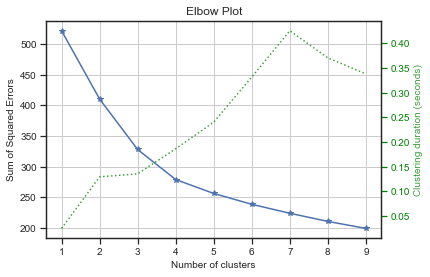

In [114]:
# skplt elbow method to determine k number of clusters

import scikitplot as skplt

kmeans = KMeans(random_state=1)
skplt.cluster.plot_elbow_curve(kmeans, X_norm, cluster_ranges=list(range(1, 10)))

4 seems to be an appropriate number of clusters

In [115]:
# two clusters
k_means = KMeans(init='k-means++', n_clusters=4, random_state=0)

# fit kmeans algorithm
k_means.fit(X_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [116]:
# clustering results
k_means.labels_

array([2, 2, 2, ..., 0, 0, 0], dtype=int32)

In [117]:
# cluster centroids or centers
k_means.cluster_centers_

array([[-6.87784175e-02, -2.30904534e-02, -2.86002997e-02,
        -3.44339872e-03, -1.96600687e-02, -2.76350345e-02,
        -4.80910329e-03, -8.82336432e-04, -2.38140418e-02,
        -6.95098771e-04, -2.98240072e-02, -2.65824959e-02,
        -1.79621156e-01, -1.86156114e-02, -1.56973238e-02],
       [-3.09940954e-02,  1.25430886e-03, -2.84355056e-02,
        -4.17180124e-04, -2.08844351e-02, -2.55951890e-02,
        -1.30054338e-03,  2.04633297e-03, -1.81799413e-02,
        -2.97945565e-04,  1.06028845e-02, -2.13346342e-02,
         1.49158013e-01, -1.46579411e-02, -1.00820015e-02],
       [ 2.56314645e-01,  4.54120622e-02, -2.29663723e-02,
         8.26678790e-03,  1.01209975e-01,  1.21796636e-01,
         1.33143697e-02, -5.55065152e-04,  1.00256577e-01,
         2.67775812e-03,  6.58459091e-02,  1.04978803e-01,
         7.06789784e-02,  8.52154275e-02,  5.77726860e-02],
       [ 1.00287883e-01,  5.46865644e-02,  6.05471977e-01,
         9.03503007e-03,  5.19796234e-02,  1.03550911

In [118]:
# Add cluster label into the dataset as a column
df_cluster = pd.DataFrame(k_means.labels_, columns=['cluster'])
df_cluster.head()

,cluster
0,2
1,2
2,2
3,3
4,2


In [119]:
# adding cluster column to original df
dfC = dfC.reset_index(drop=True)
df_cluster = df_cluster.reset_index(drop=True)

df2 = dfC.join(df_cluster)
df2.head()

,num_critic_for_reviews,duration,director_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,imdb_score,aspect_ratio,movie_facebook_likes,total_production_facebook_likes,cluster
0,723.0,178.0,0.0,1000.0,760505847.0,886204,4834,0.0,3054.0,237000000.0,2009.0,7.9,1.78,33000,37834.0,2
1,302.0,169.0,563.0,40000.0,309404152.0,471220,48350,0.0,1238.0,300000000.0,2007.0,7.1,2.35,0,48913.0,2
2,602.0,148.0,0.0,11000.0,200074175.0,275868,11700,1.0,994.0,245000000.0,2015.0,6.8,2.35,85000,96700.0,2
3,813.0,164.0,22000.0,27000.0,448130642.0,1144337,106759,0.0,2701.0,250000000.0,2012.0,8.5,2.35,164000,292759.0,3
4,462.0,132.0,475.0,640.0,73058679.0,212204,1873,1.0,738.0,263700000.0,2012.0,6.6,2.35,24000,26348.0,2


In [120]:
df2.groupby(['cluster']).size()

cluster
0    1502
1    1536
2     525
3     163
dtype: int64

In [121]:
df2.mean().round().T

num_critic_for_reviews                  167.0
duration                                110.0
director_facebook_likes                 810.0
actor_1_facebook_likes                 7850.0
gross                              52844874.0
num_voted_users                      105862.0
cast_total_facebook_likes             11661.0
facenumber_in_poster                      1.0
num_user_for_reviews                    337.0
budget                             46599591.0
title_year                             2003.0
imdb_score                                6.0
aspect_ratio                              2.0
movie_facebook_likes                   9384.0
total_production_facebook_likes       21855.0
cluster                                   1.0
dtype: float64

In [122]:
df2.groupby('cluster').mean().round().T

cluster,0,1,2,3
num_critic_for_reviews,111.0,142.0,375.0,248.0
duration,103.0,110.0,123.0,126.0
director_facebook_likes,153.0,156.0,282.0,14736.0
actor_1_facebook_likes,5646.0,7583.0,13141.0,13632.0
gross,37893280.0,36962143.0,129815636.0,92375673.0
num_voted_users,59167.0,62614.0,311664.0,280834.0
cast_total_facebook_likes,8502.0,10806.0,20405.0,20649.0
facenumber_in_poster,1.0,1.0,1.0,1.0
num_user_for_reviews,217.0,245.0,844.0,680.0
budget,38108613.0,42960038.0,79309743.0,53783484.0


### Clustering Profiles

* Cluster 1
    - Films with a low score are about 20% shorter in length than highly rated movies.
    - Their directors and actors have low Facebook like counts, so they don't benefit from popularity.
    - These movies also have the least number of users who voted for them on IMDB.
    
* Cluster 2
    - This cluster is below average on all categories for the dataset except duration and title year, neither of which are important factors in IMDB score.
    - These movies are right at the mid point for duration, but have actors and directors that are likely B-list stars or rising stars. They're gaining popularity at this point, but aren't well known.
    - These movies average a marginally higher budget and gross and in fact on average lose more money than Cluster 1 IMDB score movies.
    
* Cluster 3
    - This is the largest cluster of all.
    - These are the newest movies on average with a much higher average title year.
    - These movies attract the most voters and have the highest total production Facebook likes. These are likely typical movies that are churned out by established directors and A-list actors.
    
* Cluster 4
    - These movies are the longest in duration, but are overshadowed in many categories by Cluster 3.
    - Average title year being the oldest means these movies likely have a wider range of release dates because they are highly regarded throughout the history of film making. These are all time greats.
    - The directors and actors in these movies are the most popular of all, directors are especially well known based on Facebook like counts. These are high profile directors like Steven Spielberg and actors like Tom Hanks, both of whom were a part of Saving Private Ryan rated in this cluster. These film makers are well known and considered the very best at what they do.
    

### Visualizing Clusters

In [123]:
px.scatter(df2,
          y='gross',
          x='num_voted_users',
          hover_name='imdb_score',
          labels={
               'num_voted_users': 'Number of IMDB Voters',
               'gross': 'Gross Earnings'
           },
           title='Gross Earnings by Number of Voters',
          trendline='ols')

In [124]:
px.violin(df2,
          y='gross',
          x='cluster',
          hover_name='imdb_score',
          labels={
               'cluster': 'IMDB Score Cluster',
               'gross': 'Gross Earnings'
           },
           title='Gross Earnings by IMDB Score Cluster',
          box=True)

In [125]:
px.violin(df2,
          y='num_voted_users',
          x='cluster',
          points='all',
          hover_name='imdb_score',
          labels={
               'num_voted_users': 'Number of IMDB Voters',
               'cluster': 'IMDB Score Cluster'
           },
           title='IMDB Score by Number of Voters',
          box=True)

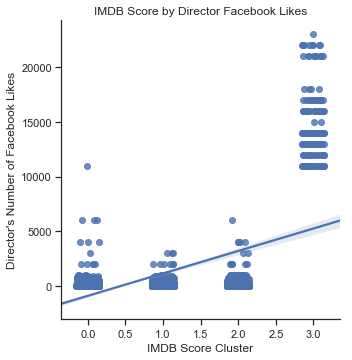

In [126]:
ax1 = sns.lmplot("cluster",
           "director_facebook_likes",
           df2,
           x_jitter=.15,
           y_jitter=.15)

ax1.set(xlabel="IMDB Score Cluster", ylabel="Director's Number of Facebook Likes")
plt.title("IMDB Score by Director Facebook Likes")
plt.show()

In [127]:
fig = px.scatter(
    df2,
    x="duration",
    y="gross",
    color='cluster',
    marginal_y="violin",
    marginal_x="box",
    trendline="ols",
    labels={
        'duration': 'Movie Duration',
        'gross': 'Gross Earnings'
    },
    title='Gross Earnings by Movie Duration',
)
fig.show()

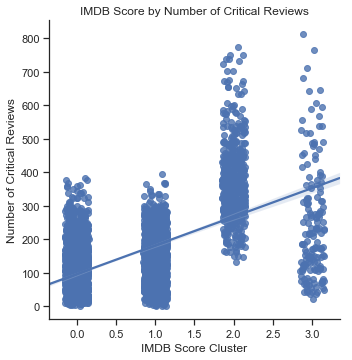

In [128]:
ax2 = sns.lmplot("cluster",
                 "num_critic_for_reviews",
                 df2,
                 x_jitter=.15,
                 y_jitter=.15)

ax2.set(xlabel="IMDB Score Cluster", ylabel="Number of Critical Reviews")
plt.title("IMDB Score by Number of Critical Reviews")
plt.show()

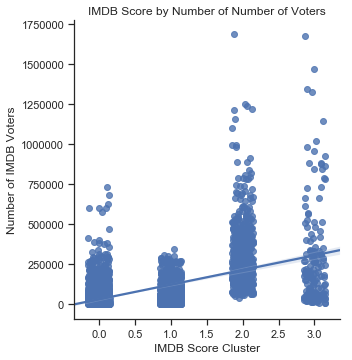

In [129]:
ax3 = sns.lmplot("cluster", "num_voted_users", df2, x_jitter=.15, y_jitter=.15)

ax3.set(xlabel="IMDB Score Cluster", ylabel="Number of IMDB Voters")
plt.title("IMDB Score by Number of Number of Voters")
plt.show()

In [130]:
px.violin(df2,
          y='imdb_score',
          x='cluster',
          points='all',
          hover_name='imdb_score',
          labels={
              'cluster': 'IMDB Score Cluster',
              'imdb_score': 'IMDB Score'
          },
          title='Distribution of IMDB Scores in each cluster',
          box=True)

## Final Project - Business Intelligence and Final Thoughts

**How to Create a Highly Rated Movie**

The biggest motivation behind creating successful movies is to generate profits and there are a couple of key areas to create a hit movie that fulfills that goal.

    - First of all, a good marketing campaign to generate hype is **vital** to a highly grossing movie. There is a strong correlation between the number of voters on IMDB and IMDB score. High numbers of voters also are related to a high gross at the box office.

    - Ensuring there is a good social media presence is another way to garner attention to the movie. Above we can see that higher social media interactions are linked to higher IMDB scores which translate to higher gross earnings.

    - Generating a larger number of critical reviews is also beneficial to increasing IMDB score. This is likely due to the increased publicity.

    - Putting A-list, popular actors together with rising star directors or extremely well known directors is far more likely to draw in voters. These movies tend to do the best in IMDB rankings.
    
**What to Avoid**

    - Short movies are related to lower scores. Average movies are 110 minutes, but movies above 120 minutes do the best.
    
    - Low budget films (under $50,000) in the data are tied to low IMDB scores and when looking at averages are actually likely to lose money.
    
    
Thank you for taking the time to review my work. I hope you found this data interesting and the conclusions to be insightful!